# Analysis of spring meshes with three degrees of freedom

## 2D mesh with arbitrary geometry, arbitrary coupling, arbitrary mass, and arbitrary spring constants

$$
\renewcommand{\abs}[1]{\lvert#1\rvert}
\renewcommand{\norm}[1]{\lVert#1\rVert}
$$
This section of the analysis is dedicated to the motion of a square mesh of equally spaced masses, where each mass is connected to its 4 nearest neighbors by springs. The displacement of each mass from equilibrium is regarded as a generalized coordinate, with 0 defined for each at its equilibrium point. The mesh will exist in the x-y plane, with gravity eventaully acting in the -z direction. In the initial anaylsis, gravity will be ignored.

The force acting on mass 1 due to the spring between mass 1 and mass 2 has magnitude proportional to the displacement of the spring and is parallel to the vector pointing from mass 1 to mass 2 in cartesian space. Let $\vec R = (R_x, R_y, R_z)$ be the vector between the two masses in equilibrium, and $\Delta \vec r = (x_1 - x_2, y_1 - y_2, z_1 - z_2)$ be the net displacement from equilibrium between the two springs. The magnitude of displacement in the spring, given by the strecthed length minus the equilibrium length, is then
$$
\abs {\vec R + \Delta \vec r} - \abs {\vec R}
$$
The new vector between the masses is the sum of the equilibrium vector and the net displacement vector, which I will define as $\vec r = \vec R + \Delta \vec r$. The corresponding unit vector is then 
$$
\hat r = \frac{\vec r}{\abs {\vec r}} = \frac{\vec R + \Delta \vec r}{\abs{\vec R + \Delta \vec r}}
$$
The force acting on mass 1 due to the spring between masses 1 and 2 is then 
$$
-k(\abs {\vec R + \Delta \vec r} - \abs {\vec R}) \hat r
$$

Each mass is attatched two its 4 direct neighbors by springs (except those at the boundary which are attatched to at least one unmoving point), so the total force acting on each mass will be the sum of the 4 spring forces. I will keep track of the masses via 2 dummy indexes i and j, so that $m_{ij}$ is located i from the top and j from the left in the mesh. The position of $m_{ij}$ with respect to equilibrium will be denoted $\vec r_{ij}$. With this new notation, Newton's second law can be applied to each mass in the mesh, keeping in mind that all masses and spring constants held equal: 
$$
\begin {align}
m \ddot {\vec r}_{ij} = -k[
     &(\abs{\vec R + (\vec r _{ij} - \vec r _{(i-1)j})} - \abs{\vec R}) \frac{\vec R + (\vec r _{ij} - \vec r _{(i-1)j})}{\abs{\vec R + (\vec r _{ij} - \vec r _{(i-1)j})}}\\
    +&(\abs{\vec R + (\vec r _{ij} - \vec r _{(i+1)j})} - \abs{\vec R}) \frac{\vec R + (\vec r _{ij} - \vec r _{(i+1)j})}{\abs{\vec R + (\vec r _{ij} - \vec r _{(i+1)j})}}\\
    +&(\abs{\vec R + (\vec r _{ij} - \vec r _{i(j-1)})} - \abs{\vec R}) \frac{\vec R + (\vec r _{ij} - \vec r _{i(j-1)})}{\abs{\vec R + (\vec r _{ij} - \vec r _{i(j-1)})}}\\
    +&(\abs{\vec R + (\vec r _{ij} - \vec r _{i(j+1)})} - \abs{\vec R}) \frac{\vec R + (\vec r _{ij} - \vec r _{i(j-1)})}{\abs{\vec R + (\vec r _{ij} - \vec r _{i(j+1)})}}
    ]
\end {align}
$$

This is a mess, so I will now define some objects to make it look nicer. They will also allow for generalizations later on. 

I will define $\Delta \vec r _{ijkl} \equiv \vec r _{ij} - \vec r _{kl}$ to be the net equilibrium displacement vector between mass ij and mass kl.

I will define $\vec R _{ijkl}$ to be vector pointing from mass ij to mass kl in cartesian space at equilibrium. This will depend on the shape of the mesh

I will define $\vec d _{ijkl} \equiv \vec R _{ijkl} + \Delta \vec r _{ijkl}$ to be the to be vector pointing from mass ij to mass kl in cartesian space after some displacement of the masses, and $\hat d_{ijkl}$ to be the associated unit vector. 

Newton's second can then me re-written as 
$$
m \ddot {\vec r}_{ij} = \sum _{\text{kl coupled to ij}} -k(\abs{\vec d_{ijkl}} - \abs{\vec R_{ijkl}}) \hat d_{ijkl}
$$
The sum across all coupled masses can be made easier by defining an object which contains information on all of the couplings in the mesh. As such, I will define $C_{ijkl}$ such that it is equal to 1 if $m_{kl}$ is coupled to $m_{ij}$ and equal to zero otherwise. This further simplifies the equation to 
$$
m \ddot {\vec r}_{ij} = -kC_{ijkl}(\abs{\vec d_{ijkl}} - \abs{\vec R_{ijkl}}) \hat d_{ijkl}
$$
where summation across k and l is implied by the einstein summation convention. Defining the coupling object and the equilibrium length object in the way that I have allows for coupling in arbitrary arrangements, which is an added bonus of this equation. However, a major downside is that there is no simple analytic way to define a K matrix so that the equation becomes $\bold M \ddot {\vec r} = -\bold K \vec r$. Because of this, I will abandon hope of an analytic solution and write some code to model the mesh. Before then, I will make two modifications to the equation which will allow for unequal masses and spring constants. I will index the masses as $m_{ij}$ so that they are not necessarily equal, and I will define $K_{ijkl}$ as the spring constant of the spring connecting $m_{ij}$ and $$m_{kl}. This will also contain the information on which masses are coupled, as the spring constant between uncoupled masses is 0. This removes the need for the coupling constant $C_{ijkl}$. The final equation is then
$$
\ddot {\vec r}_{ij} = -\frac{K_{ijkl}}{m_{ij}}(\abs{\vec d_{ijkl}} - \abs{\vec R_{ijkl}}) \hat d_{ijkl}
$$
It should be noted that i and j are not summed over as they are chosen on the left hand side of the equation. 

Anyways, lets write some code. 

## Square mesh, no diagonal coupling

### Square mesh, equal mass, equal tension, adjacent neighbor coupling

The code should do the following:

Define the mesh in cartesian space with np.meshgrid

Define the equilibrium length tensor $\vec R_{ijkl}$ from the meshgrid, this should remain constant

Define the mass displacement matrix $\vec r_{ij}$ and velocity matrix $\dot {\vec r}_{ij}$, this will also account for initial conditions

Define the net displacement tensor $\Delta \vec r _{ijkl} = \vec r_{ij} - \vec r_{kl}$

Define the mass matrix $M_{ij}$. For equal mass, all entries should be equal. This should also remain constant

Define the Spring coupling tensor $K_{ijkl}$. This should also remain constant For adjacent neighbor coupling with equal tension
$$
K_{ijkl} = k(\delta _{ik} \delta _{(j-1)l} + \delta _{ik} \delta _{(j+1)l} + \delta _{i(k-1)} \delta _{jl} + \delta _{i(k+1)} \delta _{jl})
$$

Define the spring length tensor $\vec d_{ijkl} = \vec R_{ijkl} + \Delta \vec r _{ijkl}$

Step out the solution via looping this set of equations for some teeny tiny $\Delta t$
$$
\begin {align}
\ddot {\vec r}_{ij} &= -\frac{1}{m_{ij}}[K_{ijkl}(\abs{\vec d_{ijkl}} - \abs{\vec R_{ijkl}}) \hat d_{ijkl} ]\\
\dot {\vec r}_{ij} &= \dot {\vec r}_{ij} + \ddot {\vec r}_{ij} \Delta t\\
\vec r_{ij} &= \vec r_{ij} + \dot {\vec r}_{ij} \Delta t\\
\Delta \vec r _{ijkl} &= \vec r_{ij} - \vec r_{kl}\\
\vec d_{ijkl} &= \vec R_{ijkl} + \Delta \vec r _{ijkl}
\end {align}
$$
Note that whenever i or j is on the boundary, its acceleration and velocity should be 0 to enforce boundary conditions

In [25]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.cm as cm
import matplotlib.colors as colors
from IPython.display import HTML
import plotly.graph_objects as go

In [26]:
def get_M_ij(r_ij, m):
    i_max = len(r_ij)
    j_max = len(r_ij[0])
    M_ij = m * np.ones((i_max, j_max))
    return M_ij

def get_K_ijkl(r_ij, K_const):
    i_max = len(r_ij)
    j_max = len(r_ij[0])
    K_ijkl = np.zeros((i_max, j_max, i_max, j_max))
    for i in range(i_max):
        for j in range(j_max):
            for k in range(i_max):
                for l in range(j_max):
                    if (k == i and l == j-1) or (k == i and l == j+1) or (k == i-1 and l == j) or (k == i+1 and l == j):
                        K_ijkl[i, j, k, l] = K_const
    return K_ijkl

def get_R_ijkl(spring_length_x, spring_length_y, num_x, num_y):
    i_max = num_y
    j_max = num_x
    R_ijkl = np.zeros((i_max, j_max, i_max, j_max, 3))
    for i in range(i_max):
        for j in range(j_max):
            for k in range(i_max):
                for l in range(j_max):
                    R_ijkl[i, j, k, l] = [(l-j) * spring_length_x, (k-i) * spring_length_y, 0]
    return R_ijkl

def get_d_ijkl(r_ij, R_ijkl):
    #compute the spring displacement and direction between any 2 masses, this should be optimized to only compute the displacements between coupled masses
    i_max = len(r_ij)
    j_max = len(r_ij[0])
    delta_r_ijkl = np.zeros((i_max, j_max, i_max, j_max, 3))
    for i in range(i_max):
        for j in range(j_max):
            for k in range(i_max):
                for l in range(j_max):
                    delta_r_ijkl[i, j, k, l] = r_ij[i, j] - r_ij[k, l]
    d_ijkl = R_ijkl + delta_r_ijkl
    return d_ijkl

def get_ddot_r_ij(r_ij:np.ndarray, K_ijkl:np.ndarray, M_ij:np.ndarray, R_ijkl:np.ndarray) -> np.ndarray: 
    ddot_r_ij = np.zeros_like(r_ij)
    i_max = len(r_ij)
    j_max = len(r_ij[0])

    d_ijkl = get_d_ijkl(r_ij, R_ijkl)

    for i in range(i_max):
        #enforce boundary conditions
        if i == 0 or i == i_max -1:
                continue
        for j in range(j_max):
            #enforce boundary conditions
            if j == 0 or j == j_max -1:
                continue
            for k in range(i_max):
                for l in range(j_max):
                    if i == k and j == l:
                        #python is too stupid to know that 0/0 = 0
                        continue
                    ddot_r_ij[i, j] += K_ijkl[i, j, k, l] * (np.linalg.norm(d_ijkl[i, j, k, l]) - np.linalg.norm(R_ijkl[i, j, k, l])) * d_ijkl[i, j, k, l] / np.linalg.norm(d_ijkl[i,j,k,l])
            ddot_r_ij[i, j] *= -1/M_ij[i, j]
    return ddot_r_ij

def step_dot_r_ij(ddot_r_ij:np.ndarray, t_delta:float) -> np.ndarray:
    return t_delta * ddot_r_ij

def step_r_ij(dot_r_ij, t_delta):
    return t_delta * dot_r_ij

def get_time_series(t_final, num_steps, r_ij, dot_r_ij, M_ij, R_ijkl, K_ijkl):
    t_delta = t_final / num_steps
    t = np.linspace(0, t_final, num_steps)
    series = [None] * num_steps
    series[0] = r_ij.copy()
    for n in range(1, num_steps):
        ddot_r_ij = get_ddot_r_ij(r_ij, K_ijkl, M_ij, R_ijkl)
        r_ij += step_r_ij(dot_r_ij, t_delta)
        dot_r_ij += step_dot_r_ij(ddot_r_ij, t_delta)
        series[n] = r_ij.copy()
    return t, np.array(series)

In [27]:
m = 1 #kg
k = 2 #N/m
l_x = 0.05 #m
l_y = 0.05 #m
n_x = 13
n_y = 13

x_equilibrium = np.array([n * l_x for n in range(n_x)])
y_equilibrium = np.array([n * l_y for n in range(n_y)])
z_equilibrium = np.zeros_like(x_equilibrium)

zero_vec = np.array([0, 0, 0])
r_ij = np.zeros((n_y, n_x, 3))
dot_r_ij = np.zeros_like(r_ij)
dot_r_ij[1, 1, 2] = 4 #m/s

M_ij = get_M_ij(r_ij, m)
K_ijkl = get_K_ijkl(r_ij, k)
R_ijkl = get_R_ijkl(l_x, l_y, n_x, n_y)

t_final = 20 #s
num_steps = 5000
t, time_series = get_time_series(t_final, num_steps, r_ij, dot_r_ij, M_ij, R_ijkl, K_ijkl)

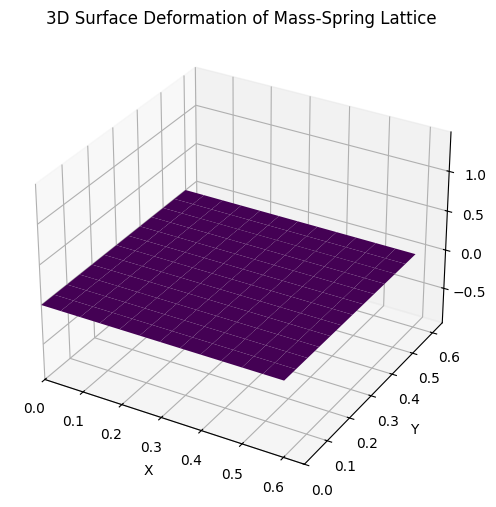

In [28]:
X_eq = np.zeros((n_y, n_x))
Y_eq = np.zeros((n_y, n_x))

for i in range(n_y):
    for j in range(n_x):
        X_eq[i, j] = j * l_x
        Y_eq[i, j] = i * l_y

fig = plt.figure(figsize=(8, 6))
ax = fig.add_subplot(111, projection='3d')

# Initial surface
X = X_eq + time_series[0, :, :, 0]
Y = Y_eq + time_series[0, :, :, 1]
Z = time_series[0, :, :, 2]

surface = ax.plot_surface(X, Y, Z, cmap='viridis')

ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')
ax.set_title('3D Surface Deformation of Mass-Spring Lattice')

ax.set_zlim(np.min(time_series[:,:,:,2]), np.max(time_series[:,:,:,2]))
ax.set_xlim(0, n_x * l_x)
ax.set_ylim(0, n_y * l_y)

def update(frame):
    global surface
    surface.remove()

    disp = time_series[frame]

    X = X_eq + disp[:, :, 0]
    Y = Y_eq + disp[:, :, 1]
    Z = disp[:, :, 2]

    surface = ax.plot_surface(X, Y, Z, cmap='viridis')
    return surface,

ani = FuncAnimation(fig, update, frames=range(0, num_steps, 10), interval=30)
HTML(ani.to_html5_video())

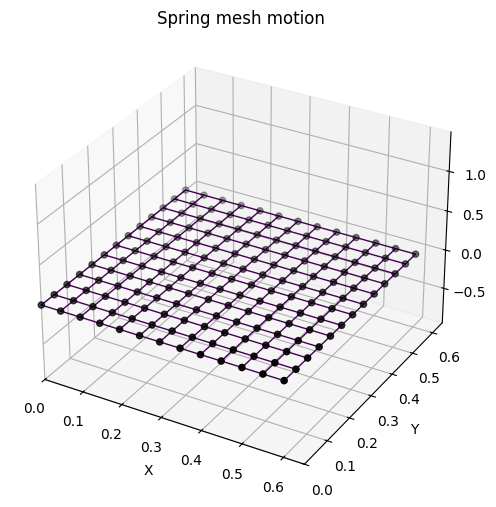

In [32]:
fig = plt.figure(figsize=(8, 6))
ax = fig.add_subplot(111, projection='3d')

ax.set_xlabel("X")
ax.set_ylabel("Y")
ax.set_zlabel("Z")
ax.set_title("Spring mesh motion")

ax.set_xlim(0, n_x * l_x)
ax.set_ylim(0, n_y * l_y)
ax.set_zlim(np.min(time_series[:,:,:,2]), np.max(time_series[:,:,:,2]))

spring_list = []   # (i1, j1, i2, j2)
rest_lengths = []  # scalar rest length for each spring
wire_lines = []

disp0 = time_series[0]

X = X_eq + disp0[:, :, 0]
Y = Y_eq + disp0[:, :, 1]
Z = disp0[:, :, 2]

points = ax.scatter(X.flatten(), Y.flatten(), Z.flatten(), s=20, color="black")

for i in range(n_y):
    for j in range(n_x):
        # Right neighbor
        if j + 1 < n_x:
            spring_list.append((i, j, i, j+1))
            rest_lengths.append(l_x)    # horizontal spring
        # Down neighbor
        if i + 1 < n_y:
            spring_list.append((i, j, i+1, j))
            rest_lengths.append(l_y) 

spring_list = np.array(spring_list)
rest_lengths = np.array(rest_lengths)

for _ in spring_list:
    line, = ax.plot([], [], [], linewidth=2)
    wire_lines.append(line)

cmap = cm.viridis
tension_max = 1e-6

def update(frame):
    global tension_max

    disp = time_series[frame]

    X = X_eq + disp[:, :, 0]
    Y = Y_eq + disp[:, :, 1]
    Z = disp[:, :, 2]

    # Update scatter
    points._offsets3d = (X.flatten(), Y.flatten(), Z.flatten())

    # Compute tensions for this frame
    tensions = []
    for idx, (i1, j1, i2, j2) in enumerate(spring_list):
        dx = X[i2, j2] - X[i1, j1]
        dy = Y[i2, j2] - Y[i1, j1]
        dz = Z[i2, j2] - Z[i1, j1]
        current_length = np.sqrt(dx*dx + dy*dy + dz*dz)
        tension = abs(current_length - rest_lengths[idx])**2
        tensions.append(tension)

    tensions = np.array(tensions)

    # Update max tension for color scaling
    tension_max = max(tension_max, tensions.max())

    # Normalize tension for colormap
    norm = tensions / tension_max

    # Update wireframe colors and positions
    for line, (i1, j1, i2, j2), tval in zip(wire_lines, spring_list, norm):
        line.set_data_3d(
            [X[i1, j1], X[i2, j2]],
            [Y[i1, j1], Y[i2, j2]],
            [Z[i1, j1], Z[i2, j2]]
        )
        line.set_color(cmap(tval))
        line.set_linewidth(1.0 + 2.0 * tval)  # thicker if high tension

    return [points] + wire_lines

ani = FuncAnimation(
    fig,
    update,
    frames=range(0, num_steps, 10),
    interval=30,
    blit=False
)

HTML(ani.to_html5_video())

### Ignore this, it doesn't work

This section of the analysis is dedicated to the motion of a square mesh of equally spaced masses, where each mass is connected to its 4 nearest neighbors by springs. The position of each mass is regarded as a generalized coordinate, with 0 defined for each at its equilibrium point. The mesh will exist in the x-y plane, with gravity eventaully acting in the -z direction. In the initial anaylsis, gravity will be ignored.

The force acting on a single mass will be the sum of the forces due to the four springs attached to the mass. For a single spring connecting masses 1 and 2, the force on mass 1 will be
$$
\vec F_{12} = -k (\vec r_1 - \vec r_2)
$$
And the components of the force will be
$$
F_x = -k (x_1 - x_2) \\
F_y = -k (y_1 - y_2) \\
F_z = -k (z_1 - z_2)
$$
Now with the power of foresight, I will model the mesh as a matrix containing the positions of the masses, so that the position of the mass in the third row and second column is indexed as $\vec r_{3,2}$
The total force acting on a signle mass $m_{ij}$ is then 
$$
\begin {align}
\vec F_{ij} &= - k(\vec r_{ij} - \vec r_{(i-1)j}) - k(\vec r_{ij} - \vec r_{(i+1)j}) 
               - k(\vec r_{ij} - \vec r_{i(j-1)}) - k(\vec r_{ij} - \vec r_{i(j+1)}) \\
            &= - k(4 \vec r_{ij} - \vec r_{(i-1)j} \vec r_{(i+1)j} - \vec r_{i(j-1)} - \vec r_{i(j+1)})
\end {align}
$$
And so the differential equation governing the motion of a single mass in the mesh is given by
$$
m \ddot {\vec r}_{ij} = - k(4 \vec r_{ij} - \vec r_{(i-1)j} - \vec r_{(i+1)j} - \vec r_{i(j-1)} - \vec r_{i(j+1)})
$$
This is a analagous to a discretized version of the wave equation, $\frac{d^2 \vec r}{dt^2} = \nabla ^2 \vec r$, which relates the time evolution of a point on a surface (or in a region) to the concavity at that point. This is a neat discovery, but not entirly relevant for this problem as I am not dealing with a continuous distribution of mass. See Eben's project for more on the motion of continuous surfaces. 

Decomposing the differential equation into component form yields
$$
\begin {align}
m \ddot x_{ij} &= - k(4x_{ij} - x_{(i-1)j} - x_{(i+1)j} - x_{i(j-1)} - x_{i(j+1)})\\
m \ddot y_{ij} &= - k(4y_{ij} - y_{(i-1)j} - y_{(i+1)j} - y_{i(j-1)} - y_{i(j+1)})\\
m \ddot z_{ij} &= - k(4z_{ij} - z_{(i-1)j} - z_{(i+1)j} - z_{i(j-1)} - z_{i(j+1)})
\end {align}
$$

For the sake of the proceeding analogy I will invent the operator $\Delta _{nm}$ which is defined such that 
$\Delta _{nm} r_{ij} = r_{ij} - r_{(i+n)(j+m)}$. It should be noted that the n subscript differences in the y direction and the m subscript differences in the z direction. 

The force at a point can then be represented as
$$
\begin {align}
\vec F &= -k (\Delta _{0,-1} +\Delta _{0,1} + \Delta _{-1,0} +\Delta _{1,0} ) \vec r \\
       &= -k (\Delta _{xx} + \Delta _{yx}) \hat x
          -k (\Delta _{xy} + \Delta _{yy}) \hat y
          -k (\Delta _{xz} + \Delta _{yz}) \hat z
\end {align}
$$
Where in the second line, I recognized that the delta operators represent differencing in the same direction along different axes, and replaced the subscripts appropriately. $\Delta _{xx}$ contains the information about the net displacement of x between the masses adjacent in the x direction, $\Delta _{yz}$ contains the information about the net displacement of x between adjacent masses in the y direction, and so on.

This allows me to draw another neat yet  parallel to the Cauchy stress tensor and the associated stress vectors:
$$
\begin {align}
T^{(x)} &= T_1^{(x)} + T_2^{(x)} + T_3^{(x)} &= \sigma _{11} \hat x + \sigma _{12} \hat y + \sigma _{13} \hat z \\
T^{(y)} &= T_1^{(y)} + T_2^{(y)} + T_3^{(y)} &= \sigma _{21} \hat x + \sigma _{22} \hat y + \sigma _{23} \hat z \\
T^{(z)} &= T_1^{(z)} + T_2^{(z)} + T_3^{(z)} &= \sigma _{31} \hat x + \sigma _{32} \hat y + \sigma _{33} \hat z \\
\end {align}
$$
$$
\bold T = (\sigma _{xx} + \sigma _{yx} + \sigma _{zx}) \hat x + 
          (\sigma _{xy} + \sigma _{yy} + \sigma _{zy}) \hat y +
          (\sigma _{xz} + \sigma _{yz} + \sigma _{zz}) \hat z
$$
This analogy is a bit of a stretch (are puns appropriate in these types of projects?) as all of the first indexed z terms in the stress tensor are missing from the force equations, but this is explained by the lack of coupling along the z axis. I predict that the full tensor will be recovered in the cube mesh analysis. 

Moving on from interesting parallels, let's do a quick recap:
The force acting on each mass $m_{ij}$ is related to its displacement from equilibrium and the displacement of its immediate neighbors via the equation
$$
m \ddot {\vec r}_{ij} = - k(4 \vec r_{ij} - \vec r_{(i-1)j} - \vec r_{(i+1)j} - \vec r_{i(j-1)} - \vec r_{i(j+1)})
$$

In order to use the matrix formalism developed in class, I need to define a K matrix which acts on the position matrix to return the force acting n each mass. This is tricky, as the object containing the position of each mass is rank 2 rather than rank one like we are used to. In order to do this, I need to take a brief detour through the world of tensor multiplication. 

When multiplying tensors, it is common to return an tensor which has the same rank as the lower rank tensor. For eaxmple, multiplying a rank 2 tensor (matrix) by a rank 1 tensor (vector) returns a rank 1 tensor. With index notation and the Einstein summation convention, this is represented as 
$$ c_i = A_{ij} b_j 
$$ 
Under the hood, what is happening is actually an outer product follwed by an index contraction. The outer product returns a tensor whose rank is the sum of the two tensors which ceated it. Each component of the resulting tensor is given by 
$$ C_{ijk} = A_{ij} b_k 
$$
By contracting the second index of A with the first index of b, we can reduce the rank by 2 and recover the generally expected result
$$c_i = C_{ijj} = A_{ij}b_{j}
$$
This distinction is necessary when dealing with tensors with rank greater than 1, as contracting across different pairs of indices will yield different results. For example, when multiplying two rank 2 tensors, the elements of the outer product are defined as
$$C_{ijkl} = A_{ij}B_{kl}
$$
Contracting across the indices j and k yields the result of traditional matrix multiplication, as it is identical to multiplying the rows of A with the columns of B. But you can also choose to contract across all 4 indices, yielding a scalar, or contracting across indices i and l which is equivalent to muliplying the transposes of each matrix, or a much less conventional contraction across i and k or j and l. For this reason, it is important to keep track of which indices you care about summing across for the purpose of the multiplication. 

For this problem, I need to create a tensor operator, which I will call $\bold \Delta$, which is defined by how it operates of the elements of the position matrix, $\vec r_{ij}$. The operation is as follows:
$$
\bold \Delta \vec r_{ij} = 4 \vec r_{ij} - \vec r_{(i-1)j} - \vec r_{(i+1)j} - \vec r_{i(j-1)} - \vec r_{i(j+1)}
$$
I will allow $\bold \Delta$ to be a rank 4 tensor (because I tried to make it a rank 2 tensor and that didn't work out at all) whose elements are $\bold \Delta _{klmn}$ The elements of the outer product multiplication of $\bold \Delta$ with $\vec {\bold r}$ are then 
$$
\bold R _{klmnij} = \bold \Delta _{klmn} \vec r_{ij}
$$
I have some freedom in how I define the elements of $\bold \Delta$, as long as I contract the outer product properly. I will choose k to represent the location in the mesh in the i direction, l to represent the location in the j direction, m contain the coupling with some neighboring mass in the i direction, and n to contain the coupling with some neighbor in the j direction. We then want to contract i with m and j with n, which for some location (k, l) in the mesh sums across all of the coupled masses. This can be written as 
$$\bold \Delta _{klmn} \vec r_{mn}
$$
Which, due to how $\bold \Delta$ is defined, must be equal to $4 \vec r_{ij} - \vec r_{(i-1)j} - \vec r_{(i+1)j} - \vec r_{i(j-1)} - \vec r_{i(j+1)}$. Because k and l represent the location of the mass in the mesh in the same way i and j do, and because these are just dummy variables, I will rewrite the equation as 
$$
\bold \Delta \vec r_{ij} = \bold \Delta _{ijmn} \vec r_{mn} = 4 \vec r_{ij} - \vec r_{(i-1)j} - \vec r_{(i+1)j} - \vec r_{i(j-1)} - \vec r_{i(j+1)}
$$
By inspection, it can be seen that 
$$
\bold \Delta _{ijmn} = 4 \delta _{im} \delta _{jn} - [\delta _{(i+1)m} \delta _{jn} + 
                                                      \delta _{(i-1)m} \delta _{jn} + 
                                                      \delta _{im} \delta _{(j+1)n} +
                                                      \delta _{im} \delta _{(j-1)n}]
$$
And to confirm that this performs the desired operation, 
$$
\begin {align}
\bold \Delta _{ijmn} \vec r_{mn} 
&= [4 \delta _{im} \delta _{jn} - (\delta _{(i+1)m} \delta _{jn} + \delta _{(i-1)m} \delta _{jn} + \delta _{im} \delta _{(j+1)n} +\delta _{im} \delta _{(j-1)n})] \vec r_{mn} \\
&= 4 \delta _{im} \delta _{jn} \vec r_{mn} - (\delta _{(i-1)m} \delta _{jn} \vec r_{mn} + \delta _{(i+1)m} \delta _{jn} \vec r_{mn} + \delta _{im} \delta _{(j-1)n} \vec r_{mn} +\delta _{im} \delta _{(j+1)n}\vec r_{mn})\\
&= 4 \vec r_{ij} - \vec r_{(i-1)j} - \vec r_{(i+1)j} - \vec r_{i(j-1)} - \vec r_{i(j+1)}
\end {align}
$$

We can now and the differential equation as a tensor equation, which allows us to define the M tensor and the K tensor:
$$
\begin {align}
m \ddot {\vec r}_{ij} &= - k(4 \vec r_{ij} - \vec r_{(i-1)j} - \vec r_{(i+1)j} - \vec r_{i(j-1)} - \vec r_{i(j+1)}) \\
m \delta _{im} \delta _{jn} \ddot {\vec r_{mn}}&= -k \bold \Delta _{ijmn} \vec r_{mn} 
\end {align}
$$
And so
$$
\begin {align}
M_{ijmn} &\equiv m \delta _{im} \delta _{jn} \\
K_{ijmn} &\equiv k [4 \delta _{im} \delta _{jn} - (\delta _{(i+1)m} \delta _{jn} + \delta _{(i-1)m} \delta _{jn} + \delta _{im} \delta _{(j+1)n} + \delta _{im} \delta _{(j-1)n})]
\end {align}
$$
This gives 3 independent coupled differential equations for motion in the x, y, and z directions:
$$
\begin {align}
\bold M \ddot {\vec r}_{ij} &= -\bold K \vec r_{ij} \\
M_{ijmn} \ddot {\vec r_{mn}} &= -K _{ijmn} \vec r_{mn}
\end {align}
$$
We can now begin to solve the problem in earnest. Applying the method laid out in class to find the normal modes and amplitudes of oscillation, 
$$
(\bold K - \omega _x ^2 \bold M) \bold A _x = 0 \\
(\bold K - \omega _y ^2 \bold M) \bold A _y = 0 \\
(\bold K - \omega _z ^2 \bold M) \bold A _z = 0
$$
I will begin with the oscillation in x:
$$
(K_{ijmn} - \omega _x ^2 M_{ijmn})(A_x)_{mn} = 0 \\
(k [4 \delta _{im} \delta _{jn} - (\delta _{(i+1)m} \delta _{jn} + \delta _{(i-1)m} \delta _{jn} + \delta _{im} \delta _{(j+1)n} + \delta _{im} \delta _{(j-1)n})] - \omega _x ^2 \delta _{im} \delta _{jn})(A_x)_{mn} = 0 \\
k [4 (A_x)_{ij} - (A_x)_{(i+1)j} - (A_x)_{(i-1)j} - (A_x)_{i(j+1)} - (A_x)_{i(j-1)}] - \omega _x ^2 m (A_x)_{ij} = 0
$$


## Square mesh with diagonal coupling

## Cube mesh, no diagonal coupling

## Cube mesh with diagonal coupling

## Hexagonal mesh

## Isometric mesh